In [60]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from sklearn.utils import shuffle

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

In [61]:
TRAINING = True
EPOCHS = 10
BATCH_SIZE = 4
LOSS_ALPHA = 0.75
LR_MAX = 0.00009
LR_MIN = 0.00008

#DeepLabV3+
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation
ENCODER_OUTPUT_STRIDE=16 #default: 16
DECODER_ATROUS_RATES=(12, 24, 36) #default: (12, 24, 36)

shape: (1024, 1024, 3)


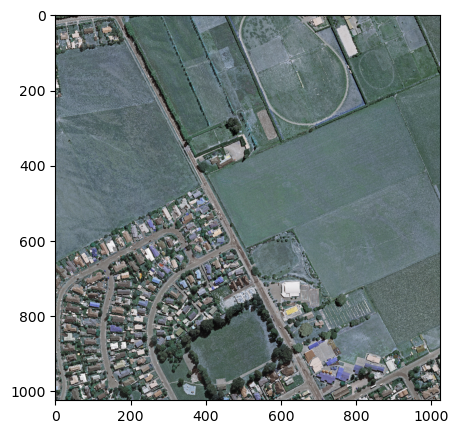

In [62]:
sample_im_file = "../../../resized-aerialimageryforroofsegmentation/train/image/christchurch_97.tif"
im = cv2.imread(sample_im_file)
print(f"shape: {im.shape}")

plt.figure(figsize=(5, 5))
plt.imshow(im)


In [63]:
sample_label_file = "../../../resized-aerialimageryforroofsegmentation/train/label/christchurch_97.tif"
im = cv2.imread(sample_label_file)
print(f"shape: {im.shape}")
print(f"values: {np.unique(im)}")

shape: (1024, 1024, 3)
values: [0 1]


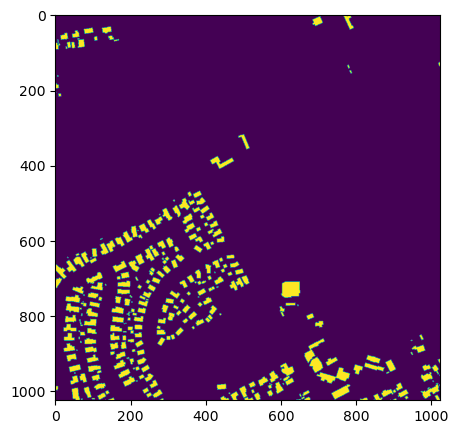

In [64]:
im = cv2.imread(sample_label_file, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(5, 5))
plt.imshow(im)

In [65]:
sample_label_vis_file = "../../../resized-aerialimageryforroofsegmentation/train/label/christchurch_97_vis.tif"
label_vis = cv2.imread(sample_label_vis_file, cv2.COLOR_BGR2GRAY)
print(f"shape: {label_vis.shape}")
print(f"values: {np.unique(label_vis)}")

shape: (1024, 1024)
values: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146
 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164
 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182
 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200
 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218
 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236
 237 238 239 240 241 24

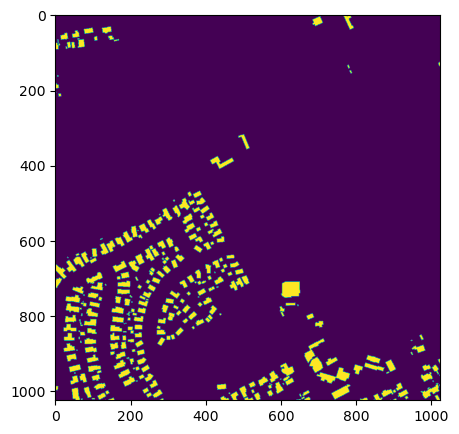

In [66]:
plt.figure(figsize=(5, 5))
plt.imshow(label_vis)

In [67]:
TRAIN_PATH = '../../../resized-aerialimageryforroofsegmentation/train'
VAL_PATH = '../../../resized-aerialimageryforroofsegmentation/val'
TEST_PATH = '../../../resized-aerialimageryforroofsegmentation/test'

def load_paths(dir_path):
    img_paths = []
    data_dir_path = os.path.join(dir_path, "image")
    for fname in os.listdir(data_dir_path):
        img_path = os.path.join(data_dir_path, fname)
        img_paths.append(img_path)

    label_paths = []
    label_vis_paths = []
    data_dir_path = os.path.join(dir_path, "label")
    for fname in os.listdir(data_dir_path):
        img_path = os.path.join(data_dir_path, fname)

        if "_vis.tif" in fname:
            label_vis_paths.append(img_path)
            continue

        label_paths.append(img_path)
        
    return sorted(img_paths), sorted(label_paths), sorted(label_vis_paths)

In [68]:
import segmentation_models_pytorch as smp

In [69]:
train_img_paths, train_label_paths, train_label_vis_paths = load_paths(TRAIN_PATH)
print(f"train len: {len(train_img_paths)}")

val_img_paths, val_label_paths, val_label_vis_paths = load_paths(VAL_PATH)
print(f"val len: {len(val_img_paths)}")

test_img_paths, test_label_paths, test_label_vis_paths = load_paths(TEST_PATH)
print(f"test len: {len(test_img_paths)}")

train len: 857
val len: 94
test len: 95


In [70]:
# Get class names
class_names = ["background", "roof"]
# Get class RGB values
class_rgb_values = [[0,0,0], [1,1,1]]

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'roof']
Class RGB values:  [[0, 0, 0], [1, 1, 1]]


In [71]:
# Useful to shortlist specific classes in datasets with large number of classes
select_classes = ["background", "roof"]

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'roof']
Class RGB values:  [[0, 0, 0], [1, 1, 1]]


In [72]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

In [73]:
# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [74]:
# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map

In [75]:
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

In [76]:
class RoadsDataset(torch.utils.data.Dataset):

    """DeepGlobe Road Extraction Challenge Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        df (str): DataFrame containing images / labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    def __init__(
            self, 
            image_paths,
            mask_paths,
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

[[  8  10   9   5  16]
 [  7  26  72   9  31]
 [  5   9   4  10 102]
 [  7  10  14  52 172]
 [109  99  73 154 108]]
(1024, 1024, 3)
[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


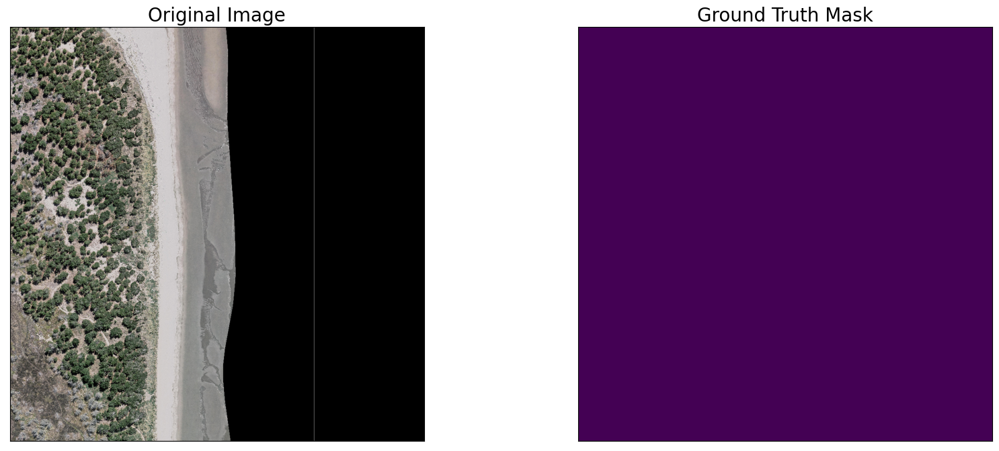

In [77]:
dataset = RoadsDataset(train_img_paths, train_label_paths, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[random_idx]

print(image[:5,:5,0])

ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values)
print(ground_truth_mask.shape)
print(ground_truth_mask[:10,:10,0])

visualize(
    original_image = image,
    ground_truth_mask = reverse_one_hot(mask),
)

In [78]:
def get_training_augmentation():
    train_transform = [
#         album.HorizontalFlip(p=0.5),
#         album.ShiftScaleRotate(shift_limit=0, scale_limit=0, rotate_limit=15, p=0.5),
#         album.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
#         album.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def get_validation_augmentation():
    train_transform = [
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

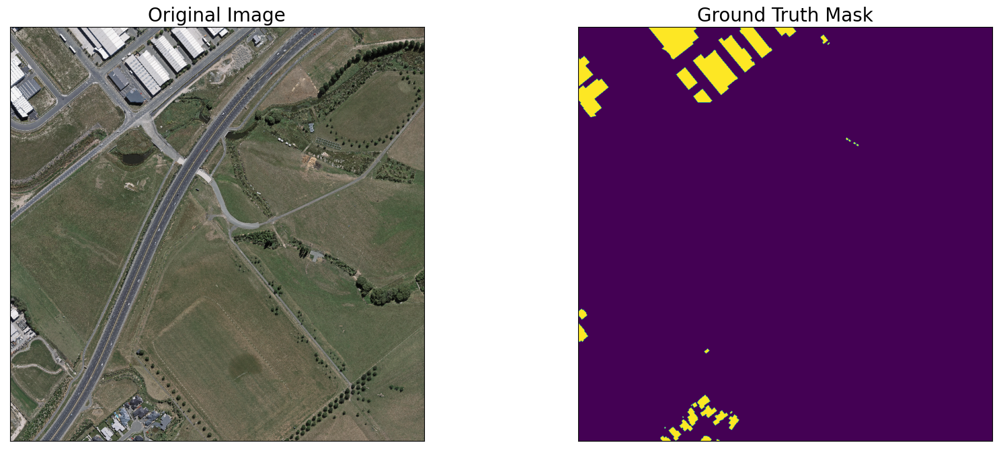

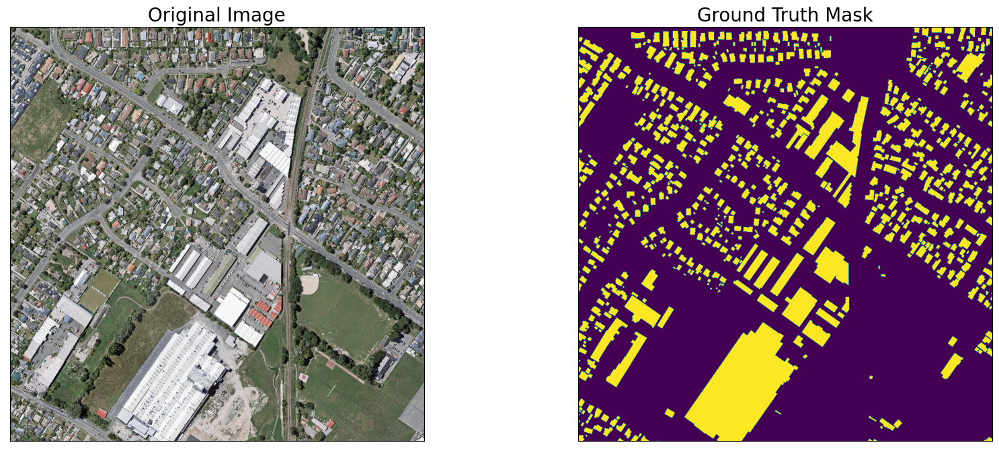

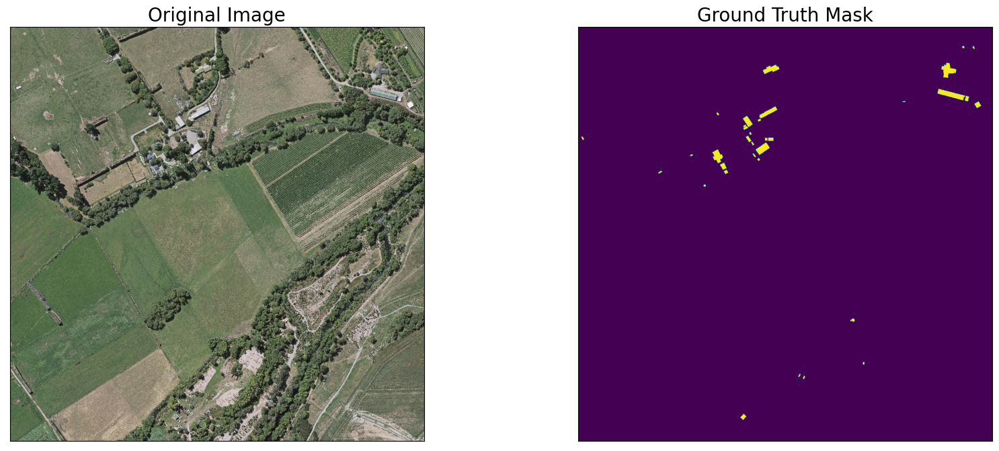

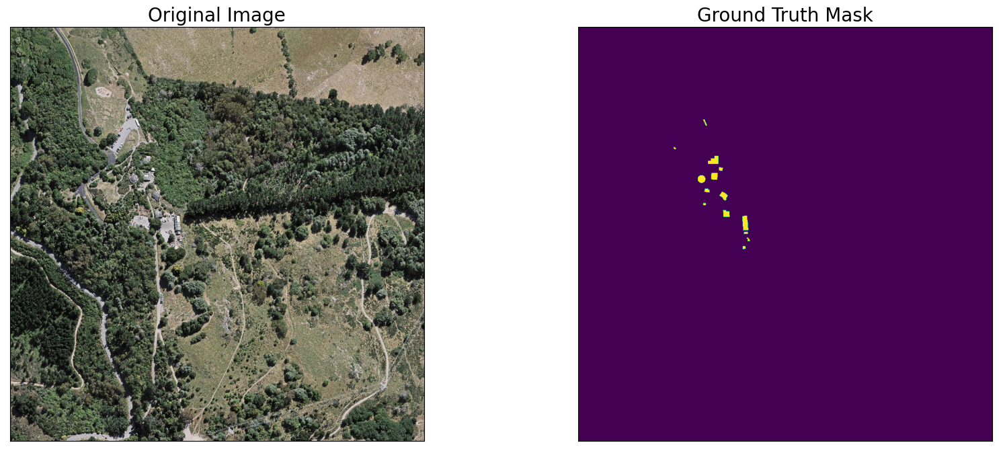

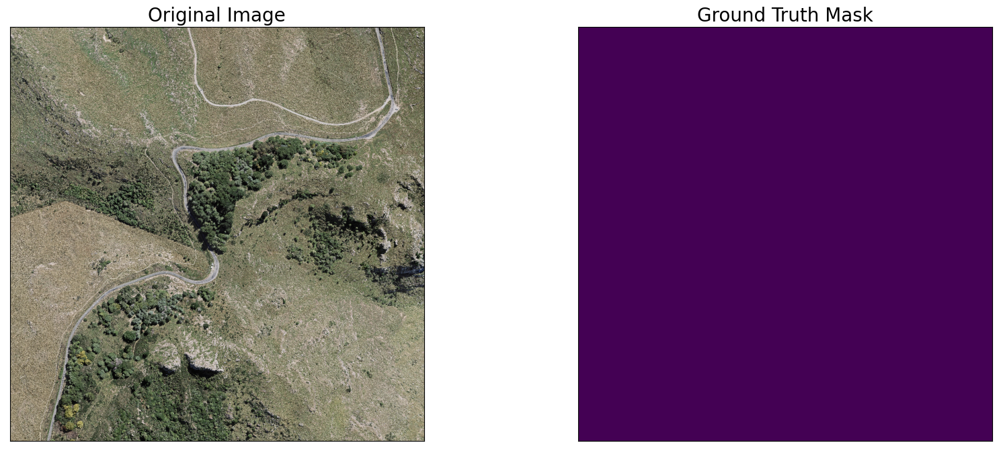

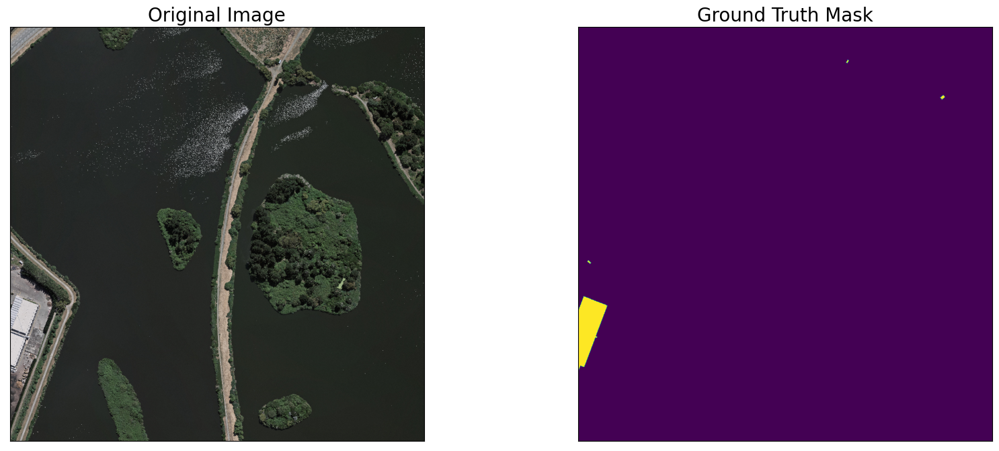

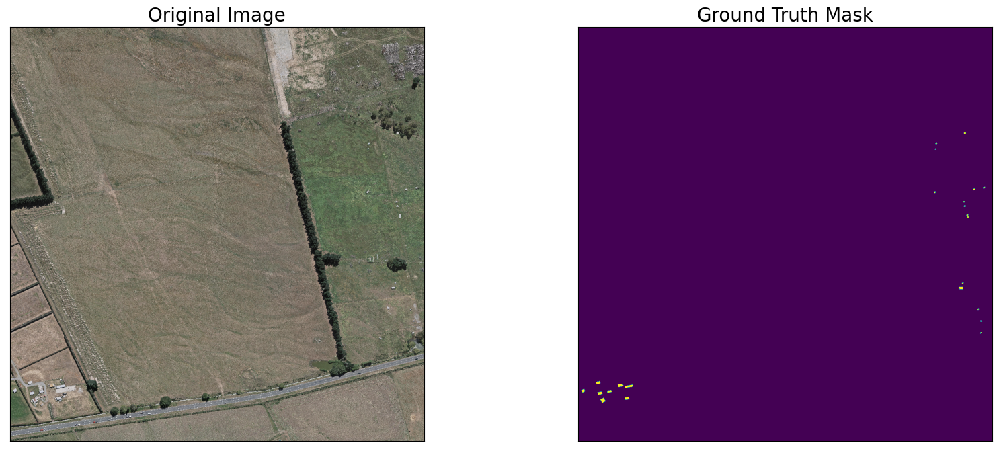

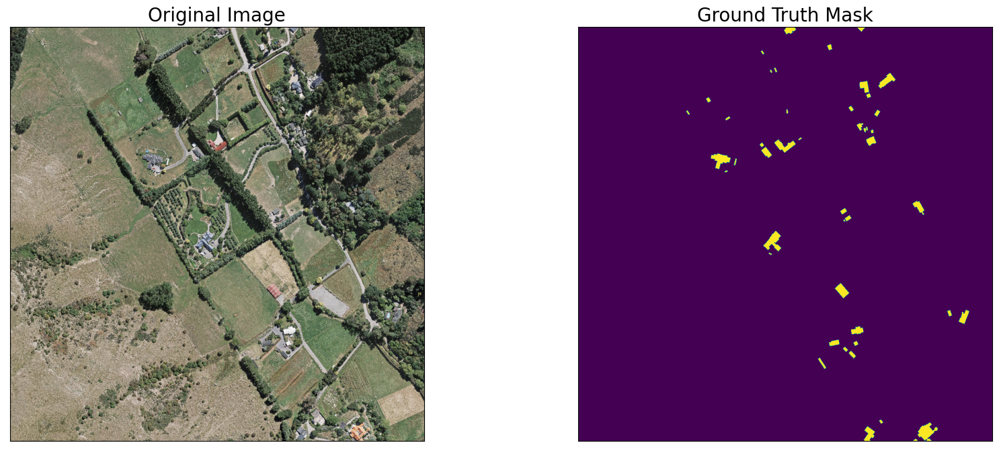

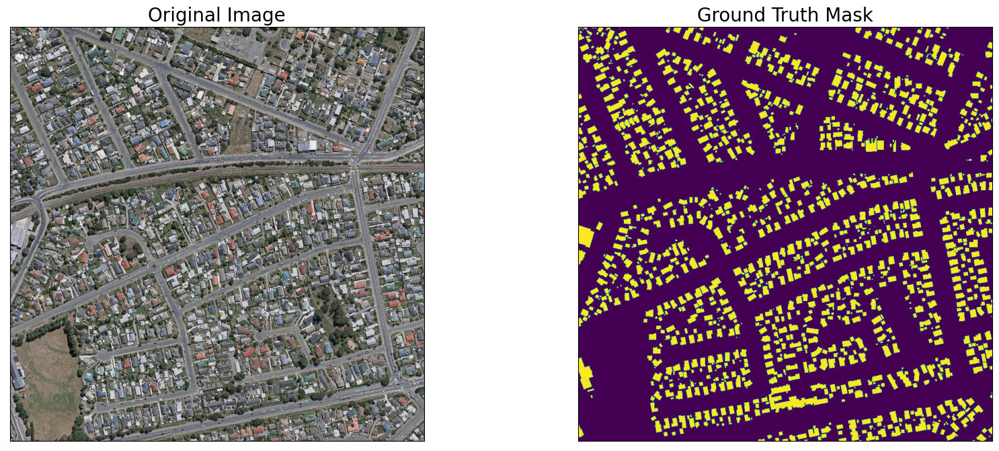

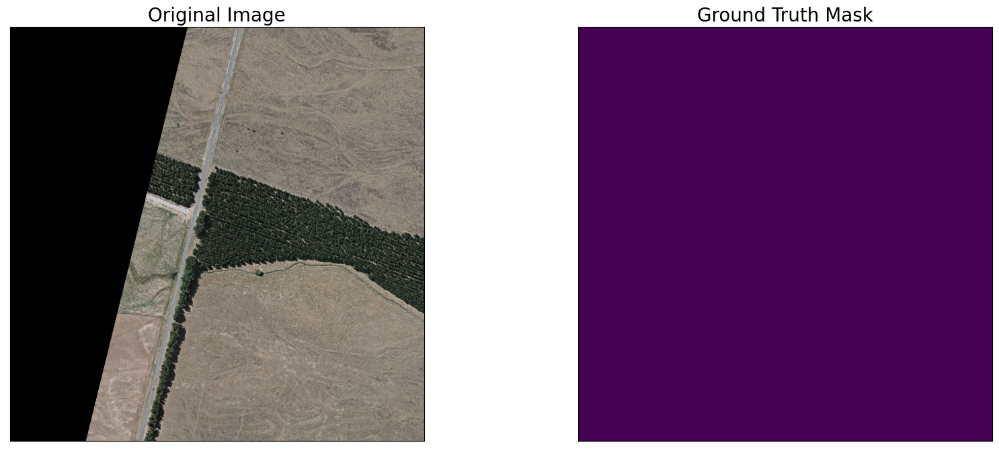

In [79]:
augmented_dataset = RoadsDataset(
    train_img_paths,
    train_label_paths, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

# Different augmentations on image/mask pairs
for _ in range(10):
    random_idx = random.randint(0, len(augmented_dataset)-1)
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = reverse_one_hot(mask)
    )

MODEL CREATION

In [80]:
CLASSES = select_classes

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
    encoder_output_stride=ENCODER_OUTPUT_STRIDE, #default: 16
    decoder_atrous_rates=DECODER_ATROUS_RATES, #default: (12, 24, 36)
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /Users/sandaludesilva/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [03:14<00:00, 527kB/s] 


In [81]:
# Get train and val dataset instances
train_dataset = RoadsDataset(
    train_img_paths,
    train_label_paths,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadsDataset(
    val_img_paths,
    val_label_paths,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, drop_last=True)

In [82]:
class CosineAnnealingWarmRestarts:
    def __init__(self, epoch=10, min_lr=1e-4, max_lr=1e-3, T_0=1, T_mult=1):
        self.epoch = epoch
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.T_0 = T_0
        self.T_mult = T_mult

    def calc_lr(self, ep):
        if ep < self.T_0:
            return self.max_lr
        ep = ep - (self.T_0-1)

        if self.T_mult == 1:
            T_cur = ep-1
            T_i = self.epoch - self.T_0
            return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

        def calc_restart_count(e, cnt):
            if e * self.T_mult > ep:
                return cnt
            return calc_restart_count(e * self.T_mult, cnt+1)

        restart_count = calc_restart_count(1, 0)
        T_cur = ep - self.T_mult ** restart_count
        T_i = max(self.T_mult ** restart_count - 1, 1)
    #     print(epoch, restart_count, T_cur, T_i)

        return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

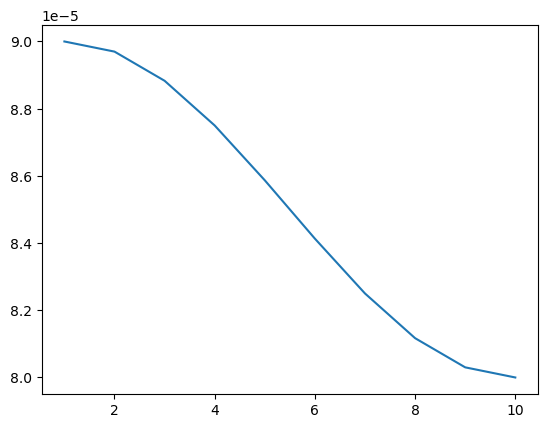

In [83]:
ca_lr_scheduler = CosineAnnealingWarmRestarts(epoch=EPOCHS, min_lr=LR_MIN, max_lr=LR_MAX, T_0=1, T_mult=1)

a = [ca_lr_scheduler.calc_lr(i) for i in range(1, EPOCHS+1)]
plt.plot(range(1, len(a)+1), a)

In [94]:
from segmentation_models_pytorch.utils import train

In [97]:
from segmentation_models_pytorch.train import ValidEpoch

# Example setup
loss = smp.utils.losses.DiceLoss()
metrics = [smp.utils.metrics.IoU()]
DEVICE = "cpu"  # Or "cpu"

valid_epoch = ValidEpoch(
    model=model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
    verbose=True,
)

ModuleNotFoundError: No module named 'segmentation_models_pytorch.train'

In [93]:
valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

AttributeError: module 'segmentation_models_pytorch' has no attribute 'utils'

In [91]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(1, EPOCHS+1):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))

        lr = ca_lr_scheduler.calc_lr(i)
        print('Learning rate: {}'.format(lr))

        optimizer = torch.optim.Adam([ 
            dict(params=model.parameters(), lr=lr),
        ])

        train_epoch = smp.utils.train.TrainEpoch(
            model, 
            loss=loss, 
            metrics=metrics, 
            optimizer=optimizer,
            device=DEVICE,
            verbose=True,
        )

        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './best_model.pth')
            print('Model saved!')


Epoch: 1
Learning rate: 9e-05


AttributeError: module 'segmentation_models_pytorch' has no attribute 'utils'